# Challenge Kueski



### 0.1. Se resolvera en lenguaje Python, utilizando diversas librerias para los modelos de Machine Learning y el preprocesamiento y visualizacion de datos:

+ pandas
+ numpy
+ scikit-learn
+ light_gbm
+ matplotlib
+ plotly
+ cufflinks
+ seaborn
+ shap


In [1]:
# lectura de archivo y filtros o transformaciones
import numpy as np
import pandas as pd
pd.set_option('display.float_format', lambda x: '%.5f' % x)
pd.set_option('max_rows', 200)
pd.set_option('max_columns', 250)
import json

# preprocesamiento de datos
from sklearn.model_selection import train_test_split
from sklearn.utils import resample

#tuneo de metaparametros
from sklearn.model_selection import GridSearchCV

# Modelos
import lightgbm as lgb
from sklearn.ensemble import GradientBoostingClassifier

# metricas de evaluacion
from sklearn.metrics import (roc_auc_score, classification_report, confusion_matrix,
                            roc_curve, accuracy_score)
# lo mismo pero en grafico
import scikitplot as skplt

# Interpretacion
from sklearn.ensemble.partial_dependence import plot_partial_dependence
import shap

# visualizacion de datos
import seaborn as sns 
import matplotlib.pyplot as plt
#interactiveViz
import plotly
import cufflinks
import plotly.plotly as py
import plotly.graph_objs as go
#mapaviz
# from mpl_toolkits.basemap import Basemap

plt.style.use('ggplot')
font = {'family' : 'sans',
        'weight' : 'bold',
        'size'   : 20}
plt.rc('font', **font)
plt.rcParams['xtick.labelsize'] = 16
plt.rcParams['ytick.labelsize'] = 16
plt.rcParams[u'figure.figsize'] = (16,8)

%matplotlib inline

# 0.2 Traduccion
Como se indico en el challenge, hay que traducir los caracteres en japones a ingles.

Se genera una funcion que nos ayudara para las diversas tablas.

In [1]:
# Se guarda el diccionario de formato json, leyendo el archivo y cargando con json
dictionary_translation = json.loads(open('translations.json').read())

In [3]:
def translate(df,cols):
    """Funcion para traducir caracteres japoneses a ingles
    itera sobre columnas seleccionas y agrega el nuevo valor por indice
    df: pandas DataFrame
    cols: lista de strings
    regresa el DataFrame con las misma columnas pero traducido"""
    for col in cols: # comprension de listas mas rapidas :)
        col_values = [dictionary_translation.get(df[col].iloc[i]) for i in range(df.shape[0])]
        df[col] = col_values
    return df

In [4]:
# Codigo muestra
cols = ['SMALL_AREA_NAME','PREF_NAME']
translate(pd.read_csv('coupon_area_train.csv').sample(5), cols)

,SMALL_AREA_NAME,PREF_NAME,COUPON_ID_hash
78860,Fukushima,Fukushima Prefecture,dae27665d3193f0b2f0f39e5dc249c32
57868,Miyazaki,Miyazaki Prefecture,fc02fcbd6778325079ebaeb370f862c6
137400,Ikebukuro Kagurazaka-Akabane,Tokyo,d8fbe25a8498578836d659d4e0283569
85299,Akita,Akita,9af57d46faa9c472c05d72b2375f7151
85324,Fukuoka,Fukuoka Prefecture,aaefdfeaa3d811207fcbf8025d79923d


Descripcion Kaggle
You are provided with a year of transactional data for 22,873 users on the site ponpare.jp. The training set spans the dates 2011-07-01 to 2012-06-23. The test set spans the week after the end of the training set, 2012-06-24 to 2012-06-30. The goal of the competition is to recommend a ranked list of coupons for each user in the dataset (found in user_list.csv). Your predictions are scored against the actual coupon purchases, made during the test set week, of the 310 possible test set coupons.

Como leimos en la descripción proporcionada por Kaggle, se trata de varias bases de datos referidas a una tienda en linea *Ponpare* que ofrece cupones y busca implementar un sistema de recomendación de cupones, para incrementar sus ventas y ofrecerle al cliente algo que probablemente quiera.

Será un problema de clasificación binaria, donde tendremos que predecir si:
+ Dependiendo del usuario y del cupon este sera usado para comprar el articulo.

Por lo que tenemos que generar un DataFrame con el cliente $A_i$ y el cupon $C_j$
tenga una probabilidad $P$ de utilizar el cupon (comprar el producto)

De aqui notamos que tendremos que generar variables que correspondan a los patrones de consumo y preferencias del cliente $A_i$

# 1.Analisis Exploratorio

Hora de revisar que traen las tablas...

In [5]:
# esta tabla provee los cupones por regiones.
cols_cat = ['SMALL_AREA_NAME','PREF_NAME']

df_cat = translate(pd.read_csv('coupon_area_train.csv'), cols_cat)
df_cat.head()

,SMALL_AREA_NAME,PREF_NAME,COUPON_ID_hash
0,Saitama,Saitama Prefecture,6b263844241eea98c5a97f1335ea82af
1,Chiba,Chiba Prefecture,cc031f250e8bad1e24060263b9fc0ddd
2,Chiba,Chiba Prefecture,ba5e9b7453ca52ff711635a5d2e8102d
3,Chiba,Chiba Prefecture,3e1ffbedca3569f9e8032d401e8cb4e6
4,Chiba,Chiba Prefecture,782934b6c815b4030ea204eef7d4a734


In [6]:
df_cat.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 138185 entries, 0 to 138184
Data columns (total 3 columns):
SMALL_AREA_NAME    138185 non-null object
PREF_NAME          138185 non-null object
COUPON_ID_hash     138185 non-null object
dtypes: object(3)
memory usage: 3.2+ MB


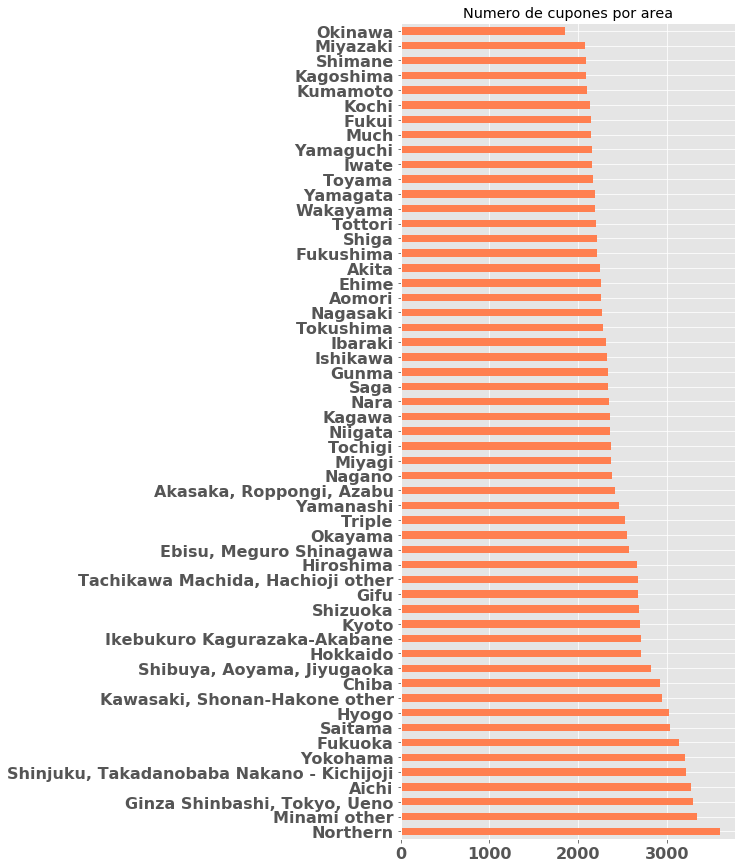

In [7]:
df_cat.SMALL_AREA_NAME.value_counts().plot.barh(figsize=(6,15),color='coral', title= 'Numero de cupones por area')

Text(10000,10,'tenemos alrededor de 19368 cupones distintos')

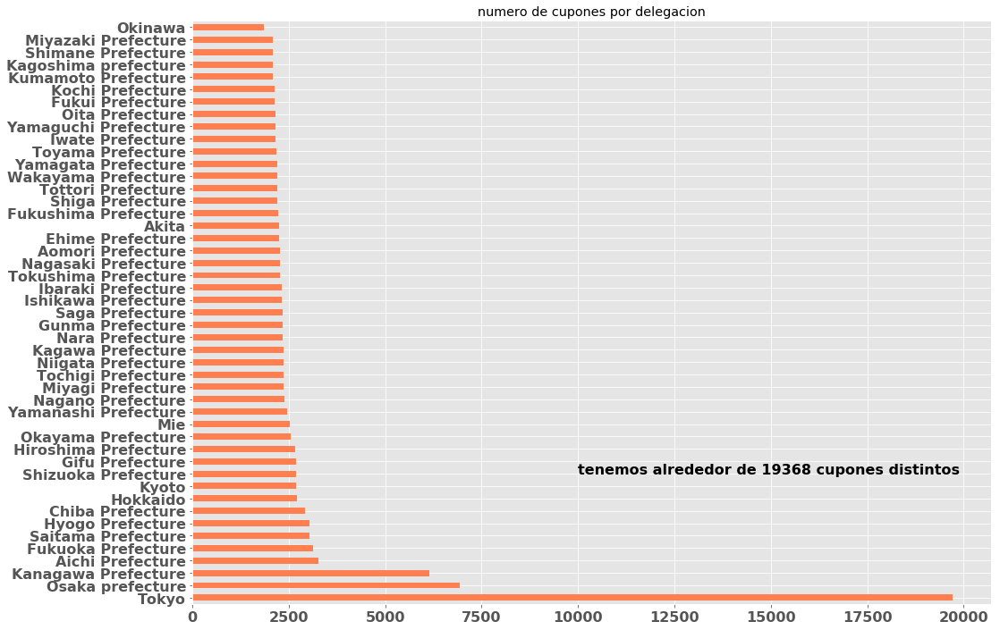

In [8]:
df_cat.PREF_NAME.value_counts().plot.barh(figsize=(16,12),color='coral', title='numero de cupones por delegacion')
plt.text(10000,10 ,'tenemos alrededor de %i cupones distintos' %len(df_cat.COUPON_ID_hash.unique()),fontsize=16)

Notamos que pueden dar el mismo cupon en diversas areas o delegaciones.

VALE LA PENA TENER TODOS LOS CUPONES O NOS FIJAMOS EN LOS MAS RECIENTES PARA ENTRENAR?

In [9]:
# Logs de compras con cupones
cols_cdt = ['SMALL_AREA_NAME']
df_cdt = translate(pd.read_csv('coupon_detail_train.csv'), cols_cdt)
df_cdt['I_DATE'] = pd.to_datetime(df_cdt['I_DATE'])
df_cdt.head()

,ITEM_COUNT,I_DATE,SMALL_AREA_NAME,PURCHASEID_hash,USER_ID_hash,COUPON_ID_hash
0,1,2012-03-28 15:06:06,Hyogo,c820a8882374a4e472f0984a8825893f,d9dca3cb44bab12ba313eaa681f663eb,34c48f84026e08355dc3bd19b427f09a
1,1,2011-07-04 23:52:54,"Ginza Shinbashi, Tokyo, Ueno",1b4eb2435421ede98c8931c42e8220ec,560574a339f1b25e57b0221e486907ed,767673b7a777854a92b73b0934ddfae7
2,1,2011-07-16 00:52:49,"Ebisu, Meguro Shinagawa",36b5f9ba46c44b65587d0b16f2e4c77f,560574a339f1b25e57b0221e486907ed,4f3b5b91d9831192557c056022fdc1f2
3,1,2011-07-16 00:54:53,"Ebisu, Meguro Shinagawa",2f30f46937cc9004774e576914b2aa1a,560574a339f1b25e57b0221e486907ed,4f3b5b91d9831192557c056022fdc1f2
4,1,2011-07-16 00:55:52,"Ebisu, Meguro Shinagawa",4d000c64a55ac573d0ae1a8f03677f50,560574a339f1b25e57b0221e486907ed,4f3b5b91d9831192557c056022fdc1f2


In [10]:
df_cdt.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 168996 entries, 0 to 168995
Data columns (total 6 columns):
ITEM_COUNT         168996 non-null int64
I_DATE             168996 non-null datetime64[ns]
SMALL_AREA_NAME    168996 non-null object
PURCHASEID_hash    168996 non-null object
USER_ID_hash       168996 non-null object
COUPON_ID_hash     168996 non-null object
dtypes: datetime64[ns](1), int64(1), object(4)
memory usage: 7.7+ MB


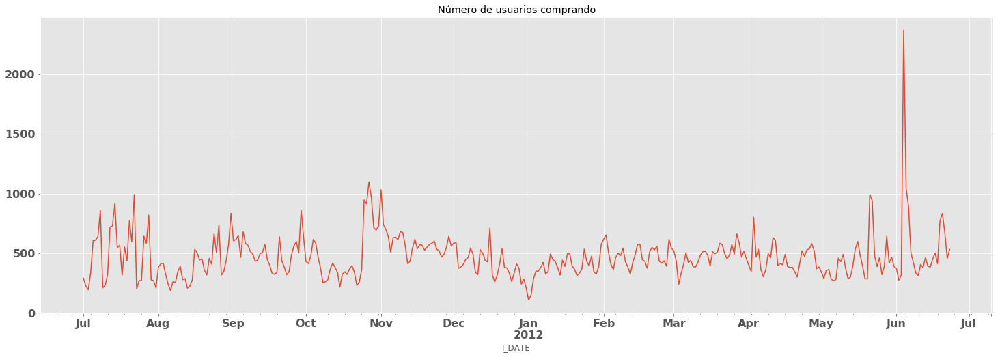

In [11]:
df_cdt.groupby(
    'I_DATE')[
    'USER_ID_hash'].count().resample(
    "D").sum().plot(figsize=(25,8),
    title='Número de usuarios comprando')

In [12]:
# dia especial
df_cdt.groupby(
    'I_DATE')[
    'ITEM_COUNT'].sum().resample(
    "D").sum().idxmax()

Timestamp('2012-06-04 00:00:00', freq='D')

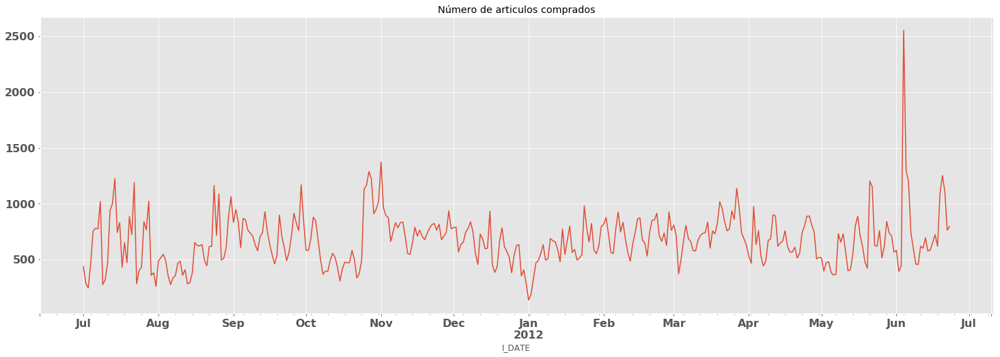

In [13]:
df_cdt.groupby(
    'I_DATE')[
    'ITEM_COUNT'].sum().resample(
    "D").sum().plot(figsize=(25,8),
    title='Número de articulos comprados')

In [14]:
df_cdt.head(10)

,ITEM_COUNT,I_DATE,SMALL_AREA_NAME,PURCHASEID_hash,USER_ID_hash,COUPON_ID_hash
0,1,2012-03-28 15:06:06,Hyogo,c820a8882374a4e472f0984a8825893f,d9dca3cb44bab12ba313eaa681f663eb,34c48f84026e08355dc3bd19b427f09a
1,1,2011-07-04 23:52:54,"Ginza Shinbashi, Tokyo, Ueno",1b4eb2435421ede98c8931c42e8220ec,560574a339f1b25e57b0221e486907ed,767673b7a777854a92b73b0934ddfae7
2,1,2011-07-16 00:52:49,"Ebisu, Meguro Shinagawa",36b5f9ba46c44b65587d0b16f2e4c77f,560574a339f1b25e57b0221e486907ed,4f3b5b91d9831192557c056022fdc1f2
3,1,2011-07-16 00:54:53,"Ebisu, Meguro Shinagawa",2f30f46937cc9004774e576914b2aa1a,560574a339f1b25e57b0221e486907ed,4f3b5b91d9831192557c056022fdc1f2
4,1,2011-07-16 00:55:52,"Ebisu, Meguro Shinagawa",4d000c64a55ac573d0ae1a8f03677f50,560574a339f1b25e57b0221e486907ed,4f3b5b91d9831192557c056022fdc1f2
5,1,2011-07-16 00:57:09,"Ebisu, Meguro Shinagawa",d8b030c8a4a2c1051997092a2985b373,560574a339f1b25e57b0221e486907ed,4f3b5b91d9831192557c056022fdc1f2
6,2,2011-07-16 00:58:29,"Ebisu, Meguro Shinagawa",2c98138766edf5d5be97ed96aa188c7d,560574a339f1b25e57b0221e486907ed,4f3b5b91d9831192557c056022fdc1f2
7,2,2011-09-07 00:04:47,"Shibuya, Aoyama, Jiyugaoka",5a45d62c72a4cc4155786b03bec74c96,560574a339f1b25e57b0221e486907ed,259a22533cab381464c89f616a56d12d
8,1,2011-10-19 22:21:50,"Shibuya, Aoyama, Jiyugaoka",592bb67c0553648d6ebd99a4442606f8,560574a339f1b25e57b0221e486907ed,f4a6f861a266799b07cd99c26e80962b
9,1,2011-12-01 16:53:45,"Ebisu, Meguro Shinagawa",509883c481716b1f3abeac8372b36a5d,560574a339f1b25e57b0221e486907ed,4257a8a169b40bbbcb002ec47ab3de13


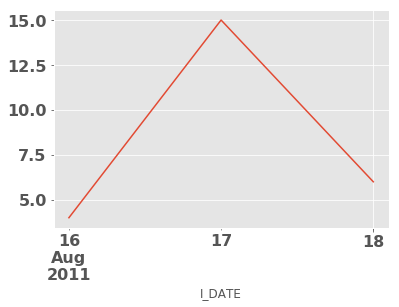

In [15]:
# algunos cupones solo salen durante pocos dias.
df_cdt[df_cdt.COUPON_ID_hash == '7397e7b1003894446d41135e7d86cc7d'].groupby('I_DATE').count().resample("D")['ITEM_COUNT'].count().plot()

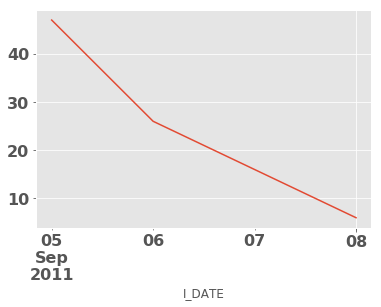

In [16]:
df_cdt[df_cdt.COUPON_ID_hash == '259a22533cab381464c89f616a56d12d'].groupby('I_DATE').count().resample("D")['ITEM_COUNT'].count().plot()

In [17]:
df_cdt.sample(10)

,ITEM_COUNT,I_DATE,SMALL_AREA_NAME,PURCHASEID_hash,USER_ID_hash,COUPON_ID_hash
78633,1,2011-08-27 23:15:27,Triple,85780e1a47c5a496321b65e1a2cdb2dc,e0b03da1c66a13a71eace218817b6609,546a631c420f76165f96998af8813771
14410,2,2012-01-26 19:12:38,"Kawasaki, Shonan-Hakone other",bd33675cafe524a66925e434a897a994,c9ca56d7d8033b4d289e4507f30d284f,28496f4afa3aa637dfc94a408154a560
619,1,2011-10-21 16:51:13,Ikebukuro Kagurazaka-Akabane,54fa5aa7b9d2c2ff16abef4c1c1d98bd,0d6c3434c4e8b74836f16cb16f7a9238,e9b164134223b99bf88b218a4dc9eaab
115702,2,2011-10-28 04:03:51,"Akasaka, Roppongi, Azabu",1a1ec109464a5592765b84d2928d0600,413f226f18c50d0d33e101aeee136cd2,894dc4aec1e7058f1ff4eb22fa397e76
23842,1,2012-06-05 10:10:52,Kagoshima,666eaa299a83c53e414a4a18ab66fc4d,3e50cb77cc22c49bd8d60dfd4dfaffc5,94dbe9a780e96451e69b54fb2ed5ab91
67843,1,2011-07-28 19:56:14,Shiga,29e2f07a0d4c52283d0172b8de53922e,436f88acc6c1a88e9bc8199bf3e4b94e,3520b6971a6d56a1f47d675cde170147
108647,1,2012-03-25 17:12:26,"Akasaka, Roppongi, Azabu",ce171e343550c7d40a0e05960938f7a8,b6d75002a2f628d47acb81f06bf86d0b,864ccc4893addd6b88d9d1100d1a53a0
40296,2,2011-11-26 14:19:29,Hyogo,6d5686f77a2a1b3c6387ff5f9d4ec9a3,91da3f4e91de93bc7a08fe06299a37ec,407a2664cb971ceb950484cf9c9a23dc
135797,2,2012-05-09 13:32:01,Gifu,789f270c53f361720e2857b6a44d3cce,346d804cc08a534269c4b753f068a856,8c4d7837e77e6cf020ea410c332819cd
156469,4,2011-09-28 16:24:53,"Ginza Shinbashi, Tokyo, Ueno",9389632b1fc07e4d373fa5d9420f1e2b,6b2f5fb8838f20b302d8764510c3cf82,6e9a5bfbb1be45a2e610a41c26107fe3


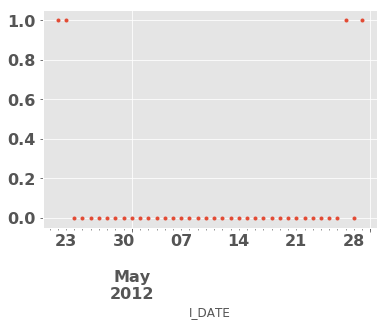

In [18]:
# Usuario con patron de compras de una semana
df_cdt[df_cdt.USER_ID_hash == '5d72a8f55d762625780aad56e9c01d52'].groupby('I_DATE').count().resample("D")['ITEM_COUNT'].count().plot(style='.')

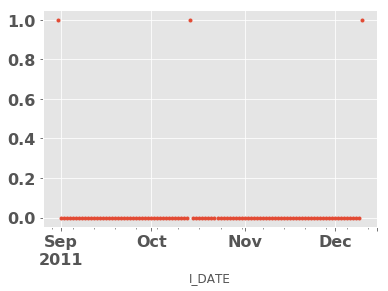

In [19]:
# usuario con patron de compras mensual
df_cdt[df_cdt.USER_ID_hash == '0d79640163ca5c7366ba6f7c15dc08bb'].groupby('I_DATE').count().resample("D")['ITEM_COUNT'].count().plot(style='.')

In [20]:
# Cada cuando compran los usuarios
# df.date_column.dt.to_period('M')
df_cdt['fecha_de_compra'] = df_cdt.I_DATE.dt.to_period('D')
df_cdt['fecha_de_compra'] = pd.to_datetime(df_cdt.fecha_de_compra.astype(str))
a = df_cdt.groupby(['USER_ID_hash','fecha_de_compra'])['ITEM_COUNT'].count().reset_index()
a['rank'] = a.groupby('USER_ID_hash').fecha_de_compra.rank().astype(int)
a['dec'] = np.where(a.rank != 1, a.groupby('USER_ID_hash').fecha_de_compra.diff() / np.timedelta64(1, 'D'), 0)
a.fillna(0,inplace=True)
a['dec'] = a['dec'].astype(int)

Mediana de dias entre compras 8


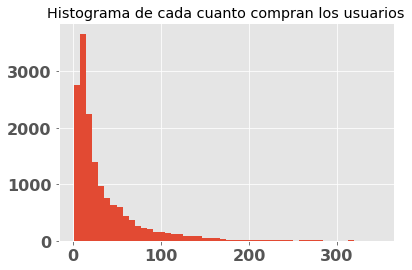

In [21]:
a[a.dec!=0].groupby('USER_ID_hash').dec.median().hist(bins=50)
plt.title('Histograma de cada cuanto compran los usuarios')
print("Mediana de dias entre compras %i" % a.dec.median().mean())

In [22]:
# la variable generada se guarda para futuro uso.
dec = a.groupby('USER_ID_hash').dec.median().reset_index()

Aqui podemos considerar acotar los datos de usuarios y cupones que se utilizaron en un cierto periodo para predecir si usara el cupon el usuario o no.
Dado que es posible que un cupon ya no este en circulación o haya sido de solo una promoción en especifico y ya no exista tal promo.

De igual manera los datos nos indican que los patrones de consumo de la mayoria de los usuarios son semanales

__Se decidio utilizar los usuarios y cupones que han sido comprados durante los úlitmos 4 meses... periodo de Marzo A Julio quitando un posible dia de mega promocion que es atipico a los datos registrados 2012-06-04__

In [23]:
df_cdt = df_cdt[
    pd.to_datetime('20120301') < df_cdt.I_DATE][df_cdt.fecha_de_compra != '2012-06-04'].reset_index(drop=True)

/home/serch/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:2: UserWarning:

Boolean Series key will be reindexed to match DataFrame index.



In [24]:
# Se filtran los usuarios y cupones en las siguientes bases
print('número de usuarios',len(df_cdt.USER_ID_hash.unique()),'\n','número de cupones',len(df_cdt.COUPON_ID_hash.unique()))

users = df_cdt.USER_ID_hash.unique()
cupones = df_cdt.COUPON_ID_hash.unique()

número de usuarios 12484 
 número de cupones 5848


In [25]:
print("Número de registros totales", len(users)*len(cupones))

Número de registros totales 73006432


In [26]:
# Lista de caracteristicas de cupones
cols_clt = ['CAPSULE_TEXT','GENRE_NAME','large_area_name','ken_name','small_area_name' ]

df_clt = translate(pd.read_csv('coupon_list_train.csv'), cols_clt)
df_clt = df_clt[df_clt.COUPON_ID_hash.isin(cupones)].reset_index(drop=True)
df_clt.head()

,CAPSULE_TEXT,GENRE_NAME,PRICE_RATE,CATALOG_PRICE,DISCOUNT_PRICE,DISPFROM,DISPEND,DISPPERIOD,VALIDFROM,VALIDEND,VALIDPERIOD,USABLE_DATE_MON,USABLE_DATE_TUE,USABLE_DATE_WED,USABLE_DATE_THU,USABLE_DATE_FRI,USABLE_DATE_SAT,USABLE_DATE_SUN,USABLE_DATE_HOLIDAY,USABLE_DATE_BEFORE_HOLIDAY,large_area_name,ken_name,small_area_name,COUPON_ID_hash
0,Nail and eye salon,Nail and eye salon,60,8925,3500,2012-03-27 12:00:00,2012-03-31 12:00:00,4,2012-04-02,2012-07-02,91.00000,1.00000,1.00000,1.00000,1.00000,1.00000,1.00000,0.00000,0.00000,0.00000,Kanto,Tokyo,"Ginza Shinbashi, Tokyo, Ueno",e53bc7fee8a57261ef5926a3d7f9cbbc
1,Food,Food,52,5300,2500,2012-05-31 12:00:00,2012-06-07 12:00:00,7,2012-06-09,2012-09-01,84.00000,1.00000,1.00000,1.00000,1.00000,1.00000,1.00000,1.00000,1.00000,1.00000,Kanto,Tokyo,"Ebisu, Meguro Shinagawa",e03c6242b9295e4ecb558681949e14cd
2,Food,Food,51,3480,1700,2012-03-21 12:00:00,2012-03-26 12:00:00,5,2012-03-27,2012-08-31,157.00000,1.00000,1.00000,1.00000,1.00000,1.00000,1.00000,0.00000,0.00000,1.00000,Kanto,Tokyo,"Ebisu, Meguro Shinagawa",b346ab83c84a21a542ca00bccee4047b
3,Nail and eye salon,Nail and eye salon,56,11550,4980,2012-03-11 12:00:00,2012-03-15 12:00:00,4,2012-03-16,2012-06-13,89.00000,1.00000,0.00000,1.00000,1.00000,1.00000,1.00000,1.00000,1.00000,1.00000,Kanto,Tokyo,"Shibuya, Aoyama, Jiyugaoka",806e6a864256ce10edad39392266d2b2
4,Relaxation,Relaxation,56,4600,2000,2012-04-02 12:00:00,2012-04-06 12:00:00,4,2012-04-07,2012-05-21,44.00000,1.00000,1.00000,1.00000,1.00000,1.00000,1.00000,1.00000,0.00000,1.00000,Kanto,Tokyo,"Shinjuku, Takadanobaba Nakano - Kichijoji",8750056480672c7b4e83a5cd6a995ab6


In [27]:
df_clt.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5848 entries, 0 to 5847
Data columns (total 24 columns):
CAPSULE_TEXT                  5848 non-null object
GENRE_NAME                    5848 non-null object
PRICE_RATE                    5848 non-null int64
CATALOG_PRICE                 5848 non-null int64
DISCOUNT_PRICE                5848 non-null int64
DISPFROM                      5848 non-null object
DISPEND                       5848 non-null object
DISPPERIOD                    5848 non-null int64
VALIDFROM                     4178 non-null object
VALIDEND                      4178 non-null object
VALIDPERIOD                   4178 non-null float64
USABLE_DATE_MON               3997 non-null float64
USABLE_DATE_TUE               3997 non-null float64
USABLE_DATE_WED               3997 non-null float64
USABLE_DATE_THU               3997 non-null float64
USABLE_DATE_FRI               3997 non-null float64
USABLE_DATE_SAT               3997 non-null float64
USABLE_DATE_SUN        

Como notamos existen columnas con valores nulos por lo que se procede a su tratamiento.

In [28]:
df_nulos = df_clt.isnull().sum()/df_clt.shape[0]
df_nulos = df_nulos * 100
df_nulos = df_nulos[df_nulos!=0]
df_nulos

VALIDFROM                    28.55677
VALIDEND                     28.55677
VALIDPERIOD                  28.55677
USABLE_DATE_MON              31.65185
USABLE_DATE_TUE              31.65185
USABLE_DATE_WED              31.65185
USABLE_DATE_THU              31.65185
USABLE_DATE_FRI              31.65185
USABLE_DATE_SAT              31.65185
USABLE_DATE_SUN              31.65185
USABLE_DATE_HOLIDAY          31.65185
USABLE_DATE_BEFORE_HOLIDAY   31.65185
dtype: float64

El 30% y 28% de los datos so nulos por lo que es conveniente rellenarlos, en lugar de volarlos.

178.0

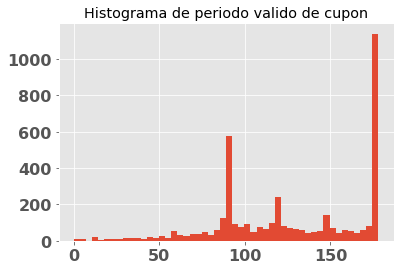

In [29]:
df_clt.VALIDPERIOD.hist(bins=50)
plt.title('Histograma de periodo valido de cupon')
df_clt.VALIDPERIOD.max()

Observamos que la mayoria de los cupones su vigencia es de 178 dias por lo que se asumira que los cupones con datos faltantes tendran esa vigencia

In [30]:
# df_clt.VALIDPERIOD.fillna(df_clt.VALIDPERIOD.max(), inplace=True)

In [31]:
df_clt[['USABLE_DATE_MON',
'USABLE_DATE_TUE',
'USABLE_DATE_WED',
'USABLE_DATE_THU',
'USABLE_DATE_FRI',
'USABLE_DATE_SAT',
'USABLE_DATE_SUN',
'USABLE_DATE_HOLIDAY',
'USABLE_DATE_BEFORE_HOLIDAY']].describe()

,USABLE_DATE_MON,USABLE_DATE_TUE,USABLE_DATE_WED,USABLE_DATE_THU,USABLE_DATE_FRI,USABLE_DATE_SAT,USABLE_DATE_SUN,USABLE_DATE_HOLIDAY,USABLE_DATE_BEFORE_HOLIDAY
count,3997.00000,3997.00000,3997.00000,3997.00000,3997.00000,3997.00000,3997.00000,3997.00000,3997.00000
mean,0.94396,0.95872,0.98874,0.98224,1.02552,1.11158,0.93370,0.94771,1.08056
std,0.29572,0.30682,0.21016,0.17310,0.29990,0.54438,0.41356,0.38166,0.51311
min,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000
25%,1.00000,1.00000,1.00000,1.00000,1.00000,1.00000,1.00000,1.00000,1.00000
50%,1.00000,1.00000,1.00000,1.00000,1.00000,1.00000,1.00000,1.00000,1.00000
75%,1.00000,1.00000,1.00000,1.00000,1.00000,1.00000,1.00000,1.00000,1.00000
max,2.00000,2.00000,2.00000,2.00000,2.00000,2.00000,2.00000,2.00000,2.00000


La mayoria de los datos en estas columnas valen 1 por lo que se utilizara este valor para rellenar.

In [32]:
nul_cols = ['USABLE_DATE_MON','USABLE_DATE_TUE','USABLE_DATE_WED',
'USABLE_DATE_THU','USABLE_DATE_FRI','USABLE_DATE_SAT',
'USABLE_DATE_SUN','USABLE_DATE_HOLIDAY','USABLE_DATE_BEFORE_HOLIDAY']
# diccionario con comprension de lista cool!
dict_nul = {x:1 for x in nul_cols}
df_clt.fillna({'VALIDPERIOD': df_clt.VALIDPERIOD.max()}, inplace=True)
df_clt.fillna(dict_nul, inplace=True)

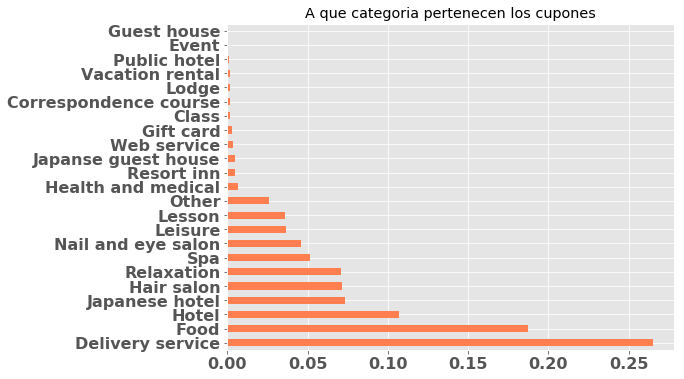

In [33]:
df_clt.CAPSULE_TEXT.value_counts(normalize=True).plot.barh(figsize=(8,6),color='coral',title='A que categoria pertenecen los cupones')

Muchos ofrecen servicio de envio de productos o cupones de comida o envio de productos (FALTA: Agrupar categorias para limpieza de datos)

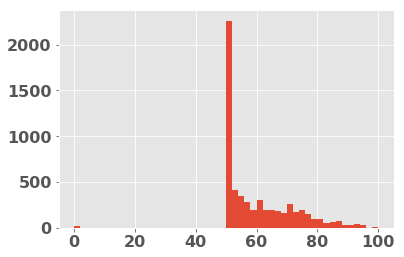

In [34]:
df_clt.PRICE_RATE.hist(bins=50)

In [35]:
df_clt.head()

,CAPSULE_TEXT,GENRE_NAME,PRICE_RATE,CATALOG_PRICE,DISCOUNT_PRICE,DISPFROM,DISPEND,DISPPERIOD,VALIDFROM,VALIDEND,VALIDPERIOD,USABLE_DATE_MON,USABLE_DATE_TUE,USABLE_DATE_WED,USABLE_DATE_THU,USABLE_DATE_FRI,USABLE_DATE_SAT,USABLE_DATE_SUN,USABLE_DATE_HOLIDAY,USABLE_DATE_BEFORE_HOLIDAY,large_area_name,ken_name,small_area_name,COUPON_ID_hash
0,Nail and eye salon,Nail and eye salon,60,8925,3500,2012-03-27 12:00:00,2012-03-31 12:00:00,4,2012-04-02,2012-07-02,91.00000,1.00000,1.00000,1.00000,1.00000,1.00000,1.00000,0.00000,0.00000,0.00000,Kanto,Tokyo,"Ginza Shinbashi, Tokyo, Ueno",e53bc7fee8a57261ef5926a3d7f9cbbc
1,Food,Food,52,5300,2500,2012-05-31 12:00:00,2012-06-07 12:00:00,7,2012-06-09,2012-09-01,84.00000,1.00000,1.00000,1.00000,1.00000,1.00000,1.00000,1.00000,1.00000,1.00000,Kanto,Tokyo,"Ebisu, Meguro Shinagawa",e03c6242b9295e4ecb558681949e14cd
2,Food,Food,51,3480,1700,2012-03-21 12:00:00,2012-03-26 12:00:00,5,2012-03-27,2012-08-31,157.00000,1.00000,1.00000,1.00000,1.00000,1.00000,1.00000,0.00000,0.00000,1.00000,Kanto,Tokyo,"Ebisu, Meguro Shinagawa",b346ab83c84a21a542ca00bccee4047b
3,Nail and eye salon,Nail and eye salon,56,11550,4980,2012-03-11 12:00:00,2012-03-15 12:00:00,4,2012-03-16,2012-06-13,89.00000,1.00000,0.00000,1.00000,1.00000,1.00000,1.00000,1.00000,1.00000,1.00000,Kanto,Tokyo,"Shibuya, Aoyama, Jiyugaoka",806e6a864256ce10edad39392266d2b2
4,Relaxation,Relaxation,56,4600,2000,2012-04-02 12:00:00,2012-04-06 12:00:00,4,2012-04-07,2012-05-21,44.00000,1.00000,1.00000,1.00000,1.00000,1.00000,1.00000,1.00000,0.00000,1.00000,Kanto,Tokyo,"Shinjuku, Takadanobaba Nakano - Kichijoji",8750056480672c7b4e83a5cd6a995ab6


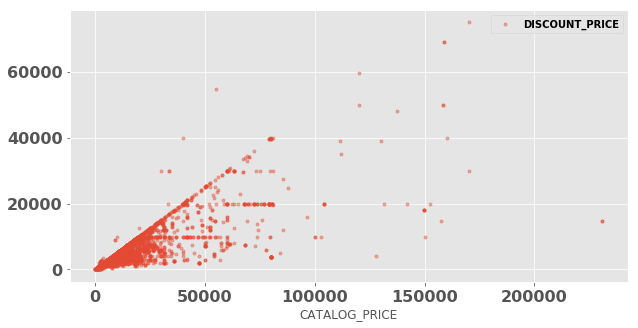

In [36]:
df_clt.plot(x='CATALOG_PRICE', y='DISCOUNT_PRICE', style='.',alpha=0.4, figsize=(10,5))

Una forma de atraer clientes es con atractivos descuentos y observamos que si tienen una tendencia a ofrecer productos más baratos

In [37]:
df_clt['descuento'] = (df_clt.DISCOUNT_PRICE/df_clt.CATALOG_PRICE)*100

In [38]:
df_clt['rango_descuento'] = pd.cut(df_clt.descuento,5)
# pd.qcut(df_clt.descuento, np.linspace(0,1,9)) # esto es por deciles 

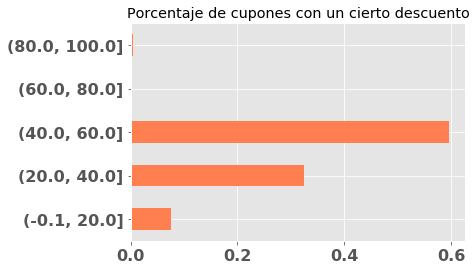

In [39]:
df_clt.rango_descuento.value_counts(normalize=True,sort=False).plot.barh(color='coral', title='Porcentaje de cupones con un cierto descuento')

La mayoria de los cupones ofrecen un 50% de descuento

Text(0.5,1,'Periodo de cupon mostrado')

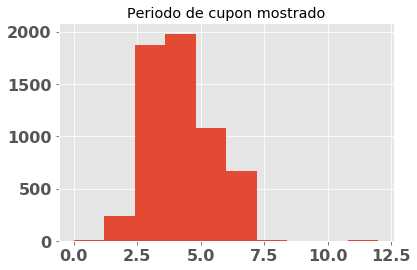

In [40]:
df_clt.DISPPERIOD.hist(bins=10)
plt.title('Periodo de cupon mostrado')

Los cupones estan disponibles durante 3 y 5 dias, es decir se exhiben un periodo corto de tiempo

In [41]:
# Tabla con coordenadas de las delegaciones
cols_pl = ['PREF_NAME','PREFECTUAL_OFFICE']
df_pl = translate(pd.read_csv('prefecture_locations.csv'), cols_pl)
df_pl.head()

,PREF_NAME,PREFECTUAL_OFFICE,LATITUDE,LONGITUDE
0,Hokkaido,Sapporo,43.06397,141.34790
1,Aomori Prefecture,Aomori,40.82462,140.74059
2,Iwate Prefecture,Morioka,39.70353,141.15267
3,Miyagi Prefecture,Sendai,38.26884,140.87210
4,Akita,Akita,39.71860,140.10233


In [42]:
df_pl.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 47 entries, 0 to 46
Data columns (total 4 columns):
PREF_NAME            47 non-null object
PREFECTUAL_OFFICE    47 non-null object
LATITUDE             47 non-null float64
LONGITUDE            47 non-null float64
dtypes: float64(2), object(2)
memory usage: 1.5+ KB


In [43]:
# Queria hacer un mapita pero no me dejo utilizar BaseMap
# Asi que lo haremos interactivo y se quitara cuando vuele mis graficos de plotly
mapbox_access_token = 'pk.eyJ1Ijoic2VyY2g4NiIsImEiOiJjanJ5czJqenkxMWIyNGFvM2JvdWhweHNrIn0._fVadL1JixCPvF-3ye_4Ng'

data = [
    go.Scattermapbox(
        lat=df_pl.LATITUDE.astype(str).values,
        lon=df_pl.LONGITUDE.astype(str).values,
        mode='markers',
        marker=dict(
            size=9
        ),
        text=df_pl.PREF_NAME.values,
    )
]

layout = go.Layout(
    autosize=True,
    hovermode='closest',
    mapbox=dict(
        accesstoken=mapbox_access_token,
        bearing=0,
        center=dict(
            lat=35.38246,
            lon=136.04006
        ),
        pitch=0,
        zoom=10
    ),
)

fig = dict(data=data, layout=layout)
py.iplot(fig, filename='Coupon Prefecture')

/home/serch/anaconda3/lib/python3.6/site-packages/IPython/core/display.py:689: UserWarning:

Consider using IPython.display.IFrame instead



Como vemos corresponden a las distintas delegaciones en japon, obteniendo unas muy alejadas unas de otras y otras cercanas a la capital (Scroll down para quitar Zoom)

In [44]:
# Lista de caracteristicas de usuarios
cols_ul = ['PREF_NAME']

df_ul = translate(pd.read_csv('user_list.csv'), cols_ul)
df_ul = df_ul[df_ul.USER_ID_hash.isin(users)].sample(frac=0.2).reset_index(drop=True)
df_ul.head()

,REG_DATE,SEX_ID,AGE,WITHDRAW_DATE,PREF_NAME,USER_ID_hash
0,2012-03-25 08:29:19,m,32,NaN,None,b55f2b88bab391d033a241cf71da7552
1,2010-09-23 10:45:38,f,36,NaN,None,32dd258ce6a0909ad21141d71239c5db
2,2010-12-20 23:36:41,m,26,NaN,None,e06b97f026fa37f85f316a4195b5c517
3,2011-05-19 18:16:54,f,43,NaN,Kochi Prefecture,9394d016ebd802ce709694a53d055789
4,2011-02-13 12:50:43,f,32,NaN,Hokkaido,a108142e681a200a7b30f8d6f3df429b


nos quedaremos con el 20% de los usuarios para un mejor manejo de datos ya que el numero de registros aumenta k-veces por cada usuario donde k es el numero de cupones.

In [45]:
df_ul.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2497 entries, 0 to 2496
Data columns (total 6 columns):
REG_DATE         2497 non-null object
SEX_ID           2497 non-null object
AGE              2497 non-null int64
WITHDRAW_DATE    13 non-null object
PREF_NAME        1767 non-null object
USER_ID_hash     2497 non-null object
dtypes: int64(1), object(5)
memory usage: 117.1+ KB


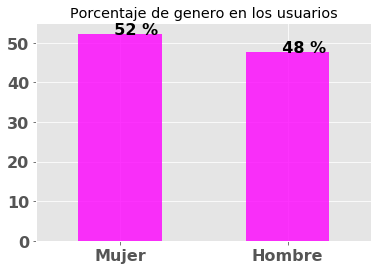

In [46]:
df_gender = df_ul.SEX_ID.value_counts(normalize=True) * 100
df_gender.plot.bar(rot=0,color = 'magenta',alpha=0.8, title='Porcentaje de genero en los usuarios')
for i,j in enumerate(df_gender.values):
    plt.text(i-0.1,j,"  %1.f %%" % j,fontsize=16)
    
plt.xticks(range(2),['Mujer', 'Hombre']);

In [47]:
df_ul.AGE.describe()

count   2497.00000
mean      43.01802
std       11.63422
min       15.00000
25%       34.00000
50%       42.00000
75%       51.00000
max       80.00000
Name: AGE, dtype: float64

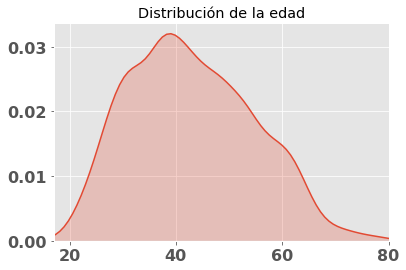

In [48]:
sns.kdeplot(df_ul.AGE,shade=True,legend=False)
plt.title('Distribución de la edad')
plt.xlim(17,80);

In [49]:
df_ul['fecha_de_registro'] = pd.to_datetime(df_ul.REG_DATE).dt.to_period('D')
df_ul['fecha_de_registro'] = pd.to_datetime(df_ul.fecha_de_registro.astype(str))

df_ul['fecha_de_retiro'] = pd.to_datetime(df_ul.WITHDRAW_DATE).dt.to_period('D')
df_ul['fecha_de_retiro'] = pd.to_datetime(df_ul.fecha_de_retiro.astype(str))

In [50]:
df_ul['antiguedad'] = np.where(df_ul.fecha_de_retiro.isnull(), 
                               (df_ul.fecha_de_registro.max() - df_ul.fecha_de_registro)/np.timedelta64(1, 'D'),
                               (df_ul.fecha_de_retiro - df_ul.fecha_de_registro)/np.timedelta64(1, 'D'))
df_ul['antiguedad'] = df_ul['antiguedad'].astype(int)

Text(0.5,1,'Histograma de antiguedad')

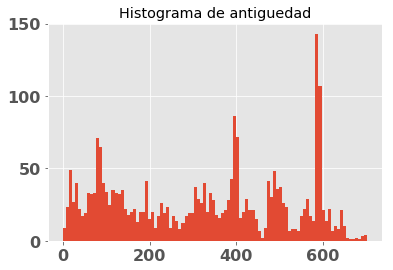

In [51]:
df_ul.antiguedad.hist(bins=100)
plt.title('Histograma de antiguedad')

Notamos que la mayoria de los usuarios tiene casi 2 años en la plataforma

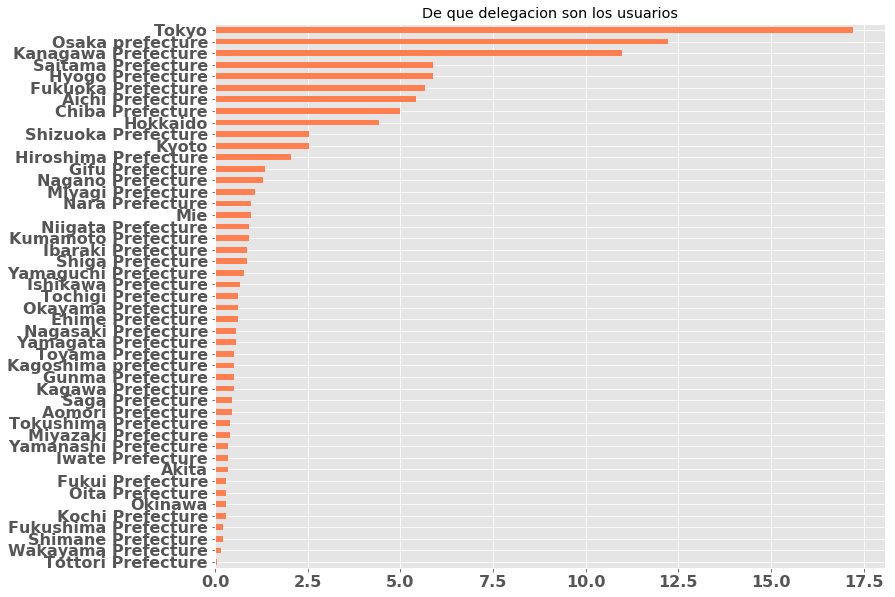

In [52]:
(df_ul.PREF_NAME.value_counts(normalize=True)*100).sort_values().plot.barh(
    figsize=(12,10),title='De que delegacion son los usuarios', color='coral')

La mayoria de los usuarios viven en las ciudades más grande de japon.

In [53]:
# logs de busqueda de cupones
df_cvt = pd.read_csv('coupon_visit_train.csv')
df_cvt['I_DATE'] = pd.to_datetime(df_cvt['I_DATE'])
df_cvt['fecha_de_vta'] = df_cvt.I_DATE.dt.to_period('D')
df_cvt['fecha_de_visita'] = pd.to_datetime(df_cvt.fecha_de_visita.astype(str))
df_cvt = df_cvt[pd.to_datetime('20120301') < df_cvt.I_DATE][df_cvt.fecha_de_visita != '2012-06-04']
df_cvt.head()

/home/serch/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:6: UserWarning:

Boolean Series key will be reindexed to match DataFrame index.



,PURCHASE_FLG,I_DATE,PAGE_SERIAL,REFERRER_hash,VIEW_COUPON_ID_hash,USER_ID_hash,SESSION_ID_hash,PURCHASEID_hash,fecha_de_visita
0,0,2012-03-28 14:15:00,7,7d3892e54acb559ae36c459978489330,34c48f84026e08355dc3bd19b427f09a,d9dca3cb44bab12ba313eaa681f663eb,673af822615593249e7c6a9a1a6bbb1a,NaN,2012-03-28
1,0,2012-03-28 14:17:28,9,7d3892e54acb559ae36c459978489330,34c48f84026e08355dc3bd19b427f09a,d9dca3cb44bab12ba313eaa681f663eb,673af822615593249e7c6a9a1a6bbb1a,NaN,2012-03-28
2,0,2012-03-28 14:20:05,16,7d3892e54acb559ae36c459978489330,17c450c3b470c045d35ec22b02daa690,d9dca3cb44bab12ba313eaa681f663eb,673af822615593249e7c6a9a1a6bbb1a,NaN,2012-03-28
3,0,2012-03-28 14:23:16,18,7d3892e54acb559ae36c459978489330,91a15e6a95d09e5e01b50747833b317d,d9dca3cb44bab12ba313eaa681f663eb,673af822615593249e7c6a9a1a6bbb1a,NaN,2012-03-28
4,0,2012-03-28 14:26:25,20,7d3892e54acb559ae36c459978489330,96fcbc8f6e45d5a2de1661eb140c6e82,d9dca3cb44bab12ba313eaa681f663eb,673af822615593249e7c6a9a1a6bbb1a,NaN,2012-03-28


In [54]:
df_cvt.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 946113 entries, 0 to 2833160
Data columns (total 9 columns):
PURCHASE_FLG           946113 non-null int64
I_DATE                 946113 non-null datetime64[ns]
PAGE_SERIAL            946113 non-null int64
REFERRER_hash          946113 non-null object
VIEW_COUPON_ID_hash    946113 non-null object
USER_ID_hash           946113 non-null object
SESSION_ID_hash        946113 non-null object
PURCHASEID_hash        40040 non-null object
fecha_de_visita        946113 non-null datetime64[ns]
dtypes: datetime64[ns](2), int64(2), object(5)
memory usage: 72.2+ MB


In [55]:
df_cvt.groupby('fecha_de_visita').PURCHASE_FLG.sum().iplot(title='Ventas diarias')

In [56]:
val = df_cvt.PURCHASE_FLG.mean()*100
print("Porcentaje de cupones tomados por visita %1.2f %%" % val)

Porcentaje de cupones tomados por visita 4.23 %


De cada 100 cupones vistos solo se venden 4 :0

## Como son los clientes que compran los cupones

In [57]:
cols_interes = ['USER_ID_hash', 'COUPON_ID_hash','ITEM_COUNT', 'SMALL_AREA_NAME', 'PURCHASEID_hash',
       'fecha_de_compra', 'SEX_ID', 'AGE',
       'PREF_NAME', 'antiguedad', 'CAPSULE_TEXT', 'PRICE_RATE',
       'CATALOG_PRICE', 'DISCOUNT_PRICE', 'DISPPERIOD',
       'VALIDPERIOD', 'USABLE_DATE_MON',
       'USABLE_DATE_TUE', 'USABLE_DATE_WED', 'USABLE_DATE_THU',
       'USABLE_DATE_FRI', 'USABLE_DATE_SAT', 'USABLE_DATE_SUN',
       'USABLE_DATE_HOLIDAY', 'USABLE_DATE_BEFORE_HOLIDAY', 'large_area_name',
       'ken_name', 'small_area_name', 'descuento', 'rango_descuento']
df_cupon_user_purchase = df_cdt.merge(
    df_ul[['SEX_ID', 'AGE','PREF_NAME','USER_ID_hash','antiguedad']], on= 'USER_ID_hash').merge(
    df_clt, on='COUPON_ID_hash')[cols_interes]

In [58]:
bins = pd.IntervalIndex.from_tuples([(10, 20), (20, 30), (30, 40),(40,50),(50,60),(60,70),(70,80)])
df_cupon_user_purchase['rango_edad'] = pd.cut(df_cupon_user_purchase.AGE,bins)

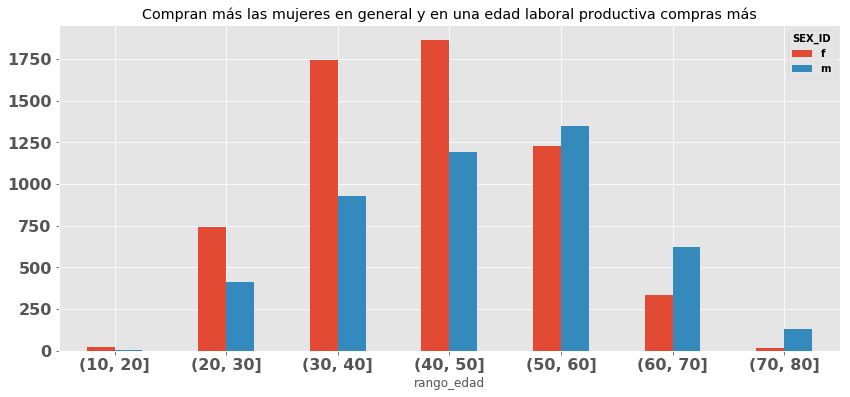

In [59]:
df_cupon_user_purchase.groupby(['SEX_ID','rango_edad'])['ITEM_COUNT'].count().unstack(0).plot.bar(
    rot=0,figsize=(14,6), title='Compran más las mujeres en general y en una edad laboral productiva compras más')

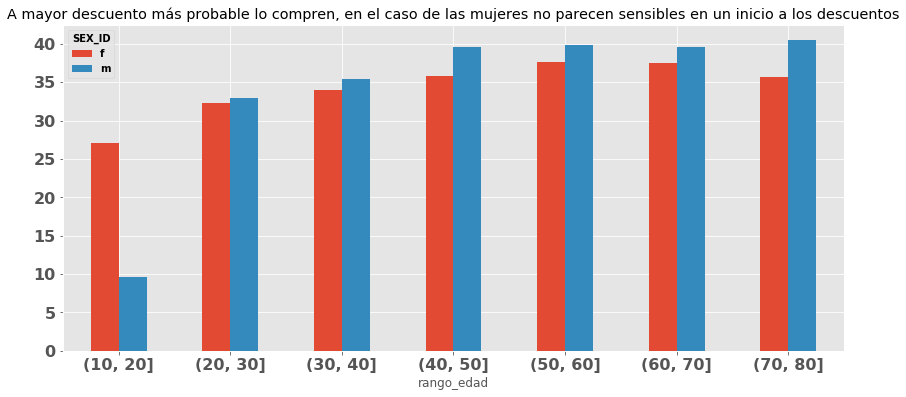

In [60]:
df_cupon_user_purchase.groupby(['SEX_ID','rango_edad'])['descuento'].mean().unstack(0).plot.bar(
    rot=0,figsize=(14,6), title='A mayor descuento más probable lo compren, en el caso de las mujeres no parecen sensibles en un inicio a los descuentos')

In [61]:
df_cupon_user_purchase = df_cupon_user_purchase.merge(dec, on ='USER_ID_hash')

# 2. Clasificacion Binaria

Se procede a generar el DataFrame que tendra nuestra variable dependiente y las variables explicativas

In [62]:
# usuarios de la muestra
users = df_ul.USER_ID_hash.values
#cupones correspondientes al periodo de interes
cupones

array(['34c48f84026e08355dc3bd19b427f09a',
       '34ea3cc1cf4ec57f3547c5fcd4de3abe',
       '129a696dac8e7eb0903f02ae217c636e', ...,
       '1894be388a6e1b67f31c79bf5cc41502',
       'd3a1ba49c19078be84468b2d95df80ae',
       '264bf0edc9e3effe364e94fd4eb42b64'], dtype=object)

In [63]:
len(users),len(cupones),len(users)*len(cupones)

(2497, 5848, 14602456)

Tomaremos en cuenta 2497 usuarios y 5848 cupones.

In [64]:
list_user_coupon = [(i,j) for i in users for j in cupones]

In [65]:
len(list_user_coupon)

14602456

Generando 14 602 456 de combinaciones

In [66]:
df_pred = pd.DataFrame(list_user_coupon, columns = ['USER_ID_hash','COUPON_ID_hash'])
df_pred['tuple'] = list(zip(df_pred['USER_ID_hash'], df_pred['COUPON_ID_hash']))
df_pred.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 14602456 entries, 0 to 14602455
Data columns (total 3 columns):
USER_ID_hash      object
COUPON_ID_hash    object
tuple             object
dtypes: object(3)
memory usage: 334.2+ MB


In [67]:
df_pred = df_pred.merge(df_cdt[['USER_ID_hash','COUPON_ID_hash','PURCHASEID_hash']], on=['USER_ID_hash','COUPON_ID_hash'], how='left')

In [68]:
df_pred.head()

,USER_ID_hash,COUPON_ID_hash,tuple,PURCHASEID_hash
0,b55f2b88bab391d033a241cf71da7552,34c48f84026e08355dc3bd19b427f09a,"(b55f2b88bab391d033a241cf71da7552, 34c48f84026...",NaN
1,b55f2b88bab391d033a241cf71da7552,34ea3cc1cf4ec57f3547c5fcd4de3abe,"(b55f2b88bab391d033a241cf71da7552, 34ea3cc1cf4...",NaN
2,b55f2b88bab391d033a241cf71da7552,129a696dac8e7eb0903f02ae217c636e,"(b55f2b88bab391d033a241cf71da7552, 129a696dac8...",NaN
3,b55f2b88bab391d033a241cf71da7552,716abc8dcbfee15cf79e7c25c77a2456,"(b55f2b88bab391d033a241cf71da7552, 716abc8dcbf...",NaN
4,b55f2b88bab391d033a241cf71da7552,cea20b04d7bb26b521db4f3803737af4,"(b55f2b88bab391d033a241cf71da7552, cea20b04d7b...",NaN


In [69]:
# se genera variable predictiva
df_pred['PURCHASEID_hash'] = np.where(df_pred.PURCHASEID_hash.notnull(),1,0)

In [70]:
df_pred.PURCHASEID_hash.sum(), df_pred.PURCHASEID_hash.mean()*100

(10594, 0.07254549500967251)

# Desbalanceo
Tenemos un problema claramente desbalanceado con solo el 0.07% de casos exitosos.

Se reducira el dataset dada la cantidad de 0's para la generacion de variables.

In [71]:
df_pred = pd.concat([df_pred[df_pred.PURCHASEID_hash == 1],df_pred[df_pred.PURCHASEID_hash == 0].sample(1989335)])

In [72]:
df_pred.shape

(1999929, 4)

In [73]:
df_pred.PURCHASEID_hash.sum(), df_pred.PURCHASEID_hash.mean()*100

(10594, 0.5297188050175782)

## Modelado

Se procede a generar las variables predictivas.
 + Que buscan describir los gustos del cliente en precio y tipo de cupon, los patrones de compras.
 + Como que tipo de categoria de cupon le gusta al cliente.
 + Que rango de precio o descuento es sensible el cliente
 + Que esta interesado en comprar
 + Las categorias favoritas del cliente
 + Las categorias recientemente vistas (aun no incluida)
 
 Se agregan variables de caracteristicas del cliente como el rango de edad, su localidad, genero.
  + SEX_ID: Tienen gustos distintos en su mayoria.
  + AGE: Los gustos por generación tienden a ser distintos
  + antiguedad: Un cliente que ya conozca la plataforma y lleve tiempo comprando es probable que acepte diversos cupones a alguien nuevo que no conoce la plataforma.

In [74]:
df_pred = df_pred.merge(df_ul[['USER_ID_hash','SEX_ID','AGE','antiguedad','PREF_NAME']], on='USER_ID_hash',how='left')

Se agrega patrones de cada cuanto compra. Puede que no tenga dinero y solo visite la pagina para checar precios. Suponiendo que a lo mejor le pagan quincenal y es menos probable que compre antes de su "pago"

In [75]:
df_pred = df_pred.merge(dec, on='USER_ID_hash',how='left')

Se agregan gustos del cliente como categoria favorita.

In [76]:
a = pd.DataFrame(df_cupon_user_purchase.groupby('USER_ID_hash')['CAPSULE_TEXT'].value_counts())
a.columns = ['frec']
a.reset_index(inplace=True)
a['rank'] = a.reset_index().groupby('USER_ID_hash')['frec'].rank(ascending=False)

In [77]:
cat_fav_1 = [a.groupby(['USER_ID_hash']).CAPSULE_TEXT.unique().str[0].values]
cat_fav_2 = [a.groupby(['USER_ID_hash']).CAPSULE_TEXT.unique().str[1].values]
cat_fav_3 = [a.groupby(['USER_ID_hash']).CAPSULE_TEXT.unique().str[2].values]

In [78]:
a = pd.DataFrame(a.groupby('USER_ID_hash').mean().reset_index().USER_ID_hash)

a['categoria_favorita_1'] = cat_fav_1[0]
a['categoria_favorita_1'] = a['categoria_favorita_1'].astype('category')
a['categoria_favorita_2'] = cat_fav_2[0]
a['categoria_favorita_2'] = a['categoria_favorita_2'].astype('category')
a['categoria_favorita_3'] = cat_fav_3[0]
a['categoria_favorita_3'] = a['categoria_favorita_3'].astype('category')

df_fav_cat = a.copy()

In [79]:
df_pred = df_pred.merge(df_fav_cat, on='USER_ID_hash',how='left')

In [80]:
# Para manejo de memoria se cambia el tipo de dato
df_pred['USER_ID_hash'] = df_pred['USER_ID_hash'].astype('category')
df_pred['COUPON_ID_hash'] = df_pred['COUPON_ID_hash'].astype('category')
df_pred['SEX_ID'] = df_pred['SEX_ID'].astype('category')
df_pred['PREF_NAME'] = df_pred['PREF_NAME'].astype('category')

Se agrega patrones de compras, como cuanto gasta que descuentos le gustan, que el cupon este disponible siempre.
Utilizando la mediana de sus compras y la desviacion estandar, pensando que si varia mucho la sd puede que no le importe tanto el precio de las cosas si no el descuento

In [81]:
df_avg_purchase = df_cupon_user_purchase.groupby('USER_ID_hash').median()[['PRICE_RATE', 'CATALOG_PRICE','DISCOUNT_PRICE','descuento']].reset_index()
df_avg_purchase.columns = ['USER_ID_hash','PRICE_RATE_avg','CATALOG_PRICE_avg','DISCOUNT_PRICE_avg','descuento_avg']

df_std_purchase = df_cupon_user_purchase.groupby('USER_ID_hash').std()[['PRICE_RATE', 'CATALOG_PRICE','DISCOUNT_PRICE','descuento']].reset_index()
df_std_purchase.columns = ['USER_ID_hash','PRICE_RATE_std','CATALOG_PRICE_std','DISCOUNT_PRICE_std','descuento_std']
df_std_purchase.fillna(0,inplace=True)

In [82]:
df_pred = df_pred.merge(df_avg_purchase, on='USER_ID_hash', how='left')

In [83]:
df_pred = df_pred.merge(df_std_purchase, on='USER_ID_hash', how='left')

Tomamos variables del tipo de cupon, su periodo de validez y cuanto tiempo estuvo expuesto al publico

In [84]:
df_cupon_purchase = df_cupon_user_purchase.groupby('COUPON_ID_hash').median()[['DISPPERIOD','VALIDPERIOD',
                                                           'USABLE_DATE_MON','USABLE_DATE_TUE','USABLE_DATE_WED','USABLE_DATE_THU',
                                                           'USABLE_DATE_FRI','USABLE_DATE_SAT','USABLE_DATE_SUN','USABLE_DATE_HOLIDAY',
                                                           'USABLE_DATE_BEFORE_HOLIDAY']].reset_index()

In [85]:
df_pred = df_pred.merge(df_cupon_purchase, on='COUPON_ID_hash', how='left')

Se agrega localidad del cupon, pensando que es mas probable que acepte el cupon si coinciden el lugar de residencia del usuario y el del cupon (PENDIENTE)

In [541]:
# df_cat.columns = ['SMALL_AREA_NAME_cupon', 'PREF_NAME_cupon', 'COUPON_ID_hash']
# df_cupon_user_purchase = df_cupon_user_purchase.merge(df_cat, on='COUPON_ID_hash',how='left')
# df_cupon_user_purchase['mismo_lugar_de_residencia'] = np.where(df_cupon_user_purchase.PREF_NAME == df_cupon_user_purchase.PREF_NAME_cupon,1,0)

In [86]:
# df_pred = df_pred.merge(
#     df_cupon_user_purchase[[
#         'USER_ID_hash','COUPON_ID_hash','mismo_lugar_de_residencia']], 
#     on=['USER_ID_hash','COUPON_ID_hash'],how='left')

In [87]:
df_pred.reset_index(drop=True,inplace=True)

## Modelo GBM
Una vez que se tienen los datos listos, se procedera al preparado de datos para el entrenamiento y su evaluacion

In [88]:
df_pred.info(null_counts=True)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1999929 entries, 0 to 1999928
Data columns (total 31 columns):
USER_ID_hash                  1999929 non-null object
COUPON_ID_hash                1999929 non-null object
tuple                         1999929 non-null object
PURCHASEID_hash               1999929 non-null int64
SEX_ID                        1999929 non-null category
AGE                           1999929 non-null int64
antiguedad                    1999929 non-null int64
PREF_NAME                     1414856 non-null category
dec                           1999929 non-null float64
categoria_favorita_1          1999929 non-null category
categoria_favorita_2          1081805 non-null category
categoria_favorita_3          531946 non-null category
PRICE_RATE_avg                1999929 non-null float64
CATALOG_PRICE_avg             1999929 non-null float64
DISCOUNT_PRICE_avg            1999929 non-null float64
descuento_avg                 1999929 non-null float64
PRICE_RATE_s

In [89]:
nul_cols = ['USABLE_DATE_MON','USABLE_DATE_TUE','USABLE_DATE_WED',
'USABLE_DATE_THU','USABLE_DATE_FRI','USABLE_DATE_SAT',
'USABLE_DATE_SUN','USABLE_DATE_HOLIDAY','USABLE_DATE_BEFORE_HOLIDAY']
# diccionario con comprension de lista cool!
dict_nul = {x:1 for x in nul_cols}
# df_pred.fillna({'mismo_lugar_de_residencia': 0}, inplace=True)
df_pred.fillna({'VALIDPERIOD': df_pred.VALIDPERIOD.max(),'DISPPERIOD':df_pred.DISPPERIOD.median()}, inplace=True)
df_pred.fillna(dict_nul, inplace=True)

In [90]:
cat_cols = ['SEX_ID','PREF_NAME','categoria_favorita_1','categoria_favorita_2','categoria_favorita_3']
df_pred = pd.get_dummies(df_pred, columns=cat_cols,dummy_na=True)

In [91]:
# cols
print([i for i in df_pred.columns])

['USER_ID_hash', 'COUPON_ID_hash', 'tuple', 'PURCHASEID_hash', 'AGE', 'antiguedad', 'dec', 'PRICE_RATE_avg', 'CATALOG_PRICE_avg', 'DISCOUNT_PRICE_avg', 'descuento_avg', 'PRICE_RATE_std', 'CATALOG_PRICE_std', 'DISCOUNT_PRICE_std', 'descuento_std', 'DISPPERIOD', 'VALIDPERIOD', 'USABLE_DATE_MON', 'USABLE_DATE_TUE', 'USABLE_DATE_WED', 'USABLE_DATE_THU', 'USABLE_DATE_FRI', 'USABLE_DATE_SAT', 'USABLE_DATE_SUN', 'USABLE_DATE_HOLIDAY', 'USABLE_DATE_BEFORE_HOLIDAY', 'SEX_ID_f', 'SEX_ID_m', 'SEX_ID_nan', 'PREF_NAME_Aichi Prefecture', 'PREF_NAME_Akita', 'PREF_NAME_Aomori Prefecture', 'PREF_NAME_Chiba Prefecture', 'PREF_NAME_Ehime Prefecture', 'PREF_NAME_Fukui Prefecture', 'PREF_NAME_Fukuoka Prefecture', 'PREF_NAME_Fukushima Prefecture', 'PREF_NAME_Gifu Prefecture', 'PREF_NAME_Gunma Prefecture', 'PREF_NAME_Hiroshima Prefecture', 'PREF_NAME_Hokkaido', 'PREF_NAME_Hyogo Prefecture', 'PREF_NAME_Ibaraki Prefecture', 'PREF_NAME_Ishikawa Prefecture', 'PREF_NAME_Iwate Prefecture', 'PREF_NAME_Kagawa Prefec

In [95]:
x_cols = ['AGE', 'antiguedad', 'dec', 'PRICE_RATE_avg', 'CATALOG_PRICE_avg', 'DISCOUNT_PRICE_avg',
          'descuento_avg', 'PRICE_RATE_std', 'CATALOG_PRICE_std', 'DISCOUNT_PRICE_std', 'descuento_std', 'DISPPERIOD', 'VALIDPERIOD', 'USABLE_DATE_MON',
          'USABLE_DATE_TUE', 'USABLE_DATE_WED', 'USABLE_DATE_THU', 'USABLE_DATE_FRI', 'USABLE_DATE_SAT', 'USABLE_DATE_SUN', 'USABLE_DATE_HOLIDAY', 
          'USABLE_DATE_BEFORE_HOLIDAY', 'SEX_ID_f', 'SEX_ID_m', 'PREF_NAME_Aichi Prefecture', 'PREF_NAME_Akita', 'PREF_NAME_Aomori Prefecture', 
          'PREF_NAME_Chiba Prefecture', 'PREF_NAME_Ehime Prefecture', 'PREF_NAME_Fukui Prefecture', 'PREF_NAME_Fukuoka Prefecture', 'PREF_NAME_Fukushima Prefecture',
          'PREF_NAME_Gifu Prefecture', 'PREF_NAME_Gunma Prefecture', 'PREF_NAME_Hiroshima Prefecture', 'PREF_NAME_Hokkaido', 'PREF_NAME_Hyogo Prefecture', 
          'PREF_NAME_Ibaraki Prefecture', 'PREF_NAME_Ishikawa Prefecture', 'PREF_NAME_Iwate Prefecture', 'PREF_NAME_Kagawa Prefecture', 'PREF_NAME_Kagoshima prefecture',
          'PREF_NAME_Kanagawa Prefecture', 'PREF_NAME_Kochi Prefecture', 'PREF_NAME_Kumamoto Prefecture', 'PREF_NAME_Kyoto', 'PREF_NAME_Mie', 'PREF_NAME_Miyagi Prefecture', 
          'PREF_NAME_Miyazaki Prefecture', 'PREF_NAME_Nagano Prefecture', 'PREF_NAME_Nagasaki Prefecture', 'PREF_NAME_Nara Prefecture', 'PREF_NAME_Niigata Prefecture', 
          'PREF_NAME_Oita Prefecture', 'PREF_NAME_Okayama Prefecture', 'PREF_NAME_Okinawa', 'PREF_NAME_Osaka prefecture', 'PREF_NAME_Saga Prefecture', 'PREF_NAME_Saitama Prefecture',
          'PREF_NAME_Shiga Prefecture', 'PREF_NAME_Shimane Prefecture', 'PREF_NAME_Shizuoka Prefecture', 'PREF_NAME_Tochigi Prefecture', 'PREF_NAME_Tokushima Prefecture', 
          'PREF_NAME_Tokyo', 'PREF_NAME_Tottori Prefecture', 'PREF_NAME_Toyama Prefecture', 'PREF_NAME_Wakayama Prefecture', 'PREF_NAME_Yamagata Prefecture', 
          'PREF_NAME_Yamaguchi Prefecture', 'PREF_NAME_Yamanashi Prefecture', 'PREF_NAME_nan', 'categoria_favorita_1_Class', 'categoria_favorita_1_Correspondence course', 
          'categoria_favorita_1_Delivery service', 'categoria_favorita_1_Event', 'categoria_favorita_1_Food', 'categoria_favorita_1_Gift card', 'categoria_favorita_1_Hair salon', 
          'categoria_favorita_1_Health and medical', 'categoria_favorita_1_Hotel', 'categoria_favorita_1_Japanese hotel', 'categoria_favorita_1_Japanse guest house', 
          'categoria_favorita_1_Leisure', 'categoria_favorita_1_Lesson', 'categoria_favorita_1_Nail and eye salon', 'categoria_favorita_1_Other', 'categoria_favorita_1_Public hotel',
          'categoria_favorita_1_Relaxation', 'categoria_favorita_1_Spa', 'categoria_favorita_1_Vacation rental', 'categoria_favorita_1_Web service', 
          'categoria_favorita_2_Class', 'categoria_favorita_2_Delivery service', 'categoria_favorita_2_Event', 'categoria_favorita_2_Food', 'categoria_favorita_2_Gift card', 
          'categoria_favorita_2_Guest house', 'categoria_favorita_2_Hair salon', 'categoria_favorita_2_Health and medical', 'categoria_favorita_2_Hotel', 
          'categoria_favorita_2_Japanese hotel', 'categoria_favorita_2_Japanse guest house', 'categoria_favorita_2_Leisure', 'categoria_favorita_2_Lesson', 
          'categoria_favorita_2_Lodge', 'categoria_favorita_2_Nail and eye salon', 'categoria_favorita_2_Other', 'categoria_favorita_2_Relaxation', 
          'categoria_favorita_2_Resort inn', 'categoria_favorita_2_Spa', 'categoria_favorita_2_Web service', 'categoria_favorita_2_nan', 'categoria_favorita_3_Delivery service',
          'categoria_favorita_3_Event', 'categoria_favorita_3_Food', 'categoria_favorita_3_Gift card', 'categoria_favorita_3_Hair salon', 'categoria_favorita_3_Health and medical',
          'categoria_favorita_3_Hotel', 'categoria_favorita_3_Japanese hotel', 'categoria_favorita_3_Japanse guest house', 
          'categoria_favorita_3_Leisure', 'categoria_favorita_3_Lesson', 'categoria_favorita_3_Lodge', 'categoria_favorita_3_Nail and eye salon', 'categoria_favorita_3_Other', 
          'categoria_favorita_3_Relaxation', 'categoria_favorita_3_Resort inn', 'categoria_favorita_3_Spa', 'categoria_favorita_3_Web service', 'categoria_favorita_3_nan']

In [96]:
print("Se trabaja con %i variables, en su mayoria categoricas" %len(x_cols))

Se trabaja con 132 variables, en su mayoria categoricas


Al tratarse de un problema desbalanceado se hara un ajuste utilizando __UnderSample__

In [97]:
x_train_test, x_valid, y_train_test, y_valid = train_test_split(
    df_pred[x_cols],
    df_pred.PURCHASEID_hash,
    test_size=0.1,
    random_state=8)

# Identify minority and majority classes
y_train_test.value_counts()
# Majority class
x_data_majority = x_train_test.loc[y_train_test == 0]
y_data_majority = y_train_test.loc[y_train_test == 0]

# Minority class
x_data_minority = x_train_test.loc[y_train_test == 1]
y_data_minority = y_train_test.loc[y_train_test == 1]

# Downsample majority class
y_df_major_downsampled = resample(y_data_majority, 
                                replace=False,    # sample without replacement
                                n_samples=y_train_test.value_counts()[1],  # to match minority class
                                random_state=10) # reproducible results

x_df_major_downsampled = resample(x_data_majority, 
                                replace=False,    # sample without replacement
                                n_samples=y_train_test.value_counts()[1],  # to match minority class
                                random_state=10) # reproducible results

# Combine minority class with downsampled majority class
y_data_downsampled = pd.concat([y_df_major_downsampled, y_data_minority])
x_data_downsampled = pd.concat([x_df_major_downsampled, x_data_minority])

# Display new class counts
y_data_downsampled.value_counts()

# Borro los de transición
#del(x_data_downsampled)
#del(y_data_downsampled)
del(y_df_major_downsampled)
del(x_df_major_downsampled)

In [98]:
# Numero de datos
y_data_downsampled.value_counts()

1    9503
0    9503
Name: PURCHASEID_hash, dtype: int64

In [99]:
x_train_down, x_test_down, y_train_down, y_test_down = train_test_split(x_data_downsampled, 
                                                                        y_data_downsampled, 
                                                                        test_size = 0.2,
                                                                        random_state=8)

## Light GBM
Se eligio este algoritmo dado que esta basado en aprendizaje con arboles y ayudara a clafisicar mejor dado que puede que haya variables que interaccionen entre ellas y este tipo de algoritmo propicia estas interacciones.


In [100]:
d_train = lgb.Dataset(x_train_down, label=y_train_down)
d_test = lgb.Dataset(x_test_down, label=y_test_down)

params = {}
params['learning_rate'] = 0.8
params['boosting_type'] = 'gbdt'
params['objective'] = 'binary'
params['metric'] = 'binary_logloss'
params['sub_feature'] = 0.5
params['num_leaves'] = 500
params['min_data'] = 10
params['max_depth'] = 50
params['num_iterations'] = 5000

clf = lgb.train(params, d_train, 100,valid_sets=[d_test], early_stopping_rounds=50,verbose_eval=1000)

/home/serch/anaconda3/lib/python3.6/site-packages/lightgbm/engine.py:116: UserWarning:

Found `num_iterations` in params. Will use it instead of argument



Training until validation scores don't improve for 50 rounds.
Early stopping, best iteration is:
[2]	valid_0's binary_logloss: 0.540707


# Evaluacion en Test

In [101]:
y_pred=clf.predict(x_test_down)
for i in range(0,len(x_test_down)):
    if y_pred[i]>=.5:
       y_pred[i]=1
    else:  
       y_pred[i]=0
    
y_pred_proba=clf.predict(x_test_down)

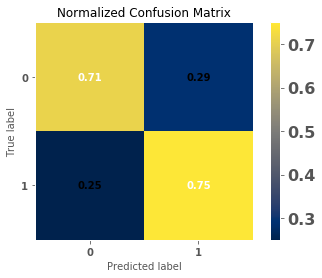

In [102]:
skplt.metrics.plot_confusion_matrix(y_test_down,y_pred,cmap='cividis',normalize=True)

In [103]:
print(classification_report(y_test_down,y_pred))
print("AUC: %.4f" %roc_auc_score(y_test_down,y_pred))

              precision    recall  f1-score   support

           0       0.74      0.71      0.72      1868
           1       0.73      0.75      0.74      1934

   micro avg       0.73      0.73      0.73      3802
   macro avg       0.73      0.73      0.73      3802
weighted avg       0.73      0.73      0.73      3802

AUC: 0.7308


# Evaluacion en Validation

In [104]:
y_pred=clf.predict(x_valid)
for i in range(len(x_valid)):
    if y_pred[i]>=.5:
       y_pred[i]=1
    else:  
       y_pred[i]=0
    
y_pred_proba=clf.predict(x_valid)

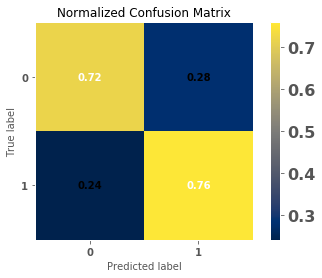

In [105]:
skplt.metrics.plot_confusion_matrix(y_valid,y_pred,cmap='cividis',normalize=True)

In [106]:
print(classification_report(y_valid,y_pred))
print("AUC: %.4f" %roc_auc_score(y_valid,y_pred))

              precision    recall  f1-score   support

           0       1.00      0.72      0.84    198902
           1       0.01      0.76      0.03      1091

   micro avg       0.72      0.72      0.72    199993
   macro avg       0.51      0.74      0.43    199993
weighted avg       0.99      0.72      0.83    199993

AUC: 0.7431


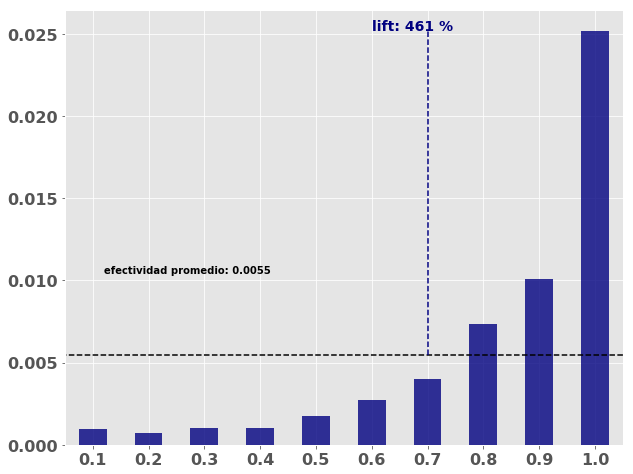

In [107]:
s1 = pd.DataFrame(clf.predict(x_valid))
df_temp = pd.DataFrame([y_valid]).T.reset_index()
df_temp['s1'] = s1
df_temp['q1'] = pd.qcut(df_temp.s1, [0.0,0.01,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9,1.0])
df_temp['d1'] = df_temp.q1.cat.rename_categories(np.arange(0.1,1.1,0.1))

a = df_temp.groupby('d1').PURCHASEID_hash.mean()
eff_prom = a.mean()
eff_mejor = a.iloc[9]
a.index = [round(i,2) for i in a.index]
a.plot.bar(rot=0,color='navy',alpha=0.8,legend=False,
    figsize=(10,8))
plt.text(0.2,df_temp.PURCHASEID_hash.mean()+0.005,"efectividad promedio: %.4f" %df_temp.PURCHASEID_hash.mean())
lift=(df_temp.groupby('d1').PURCHASEID_hash.mean()[9]/df_temp.PURCHASEID_hash.mean())*100
plt.text(5.,df_temp.groupby('d1').PURCHASEID_hash.mean()[9],"lift: %.3d %%"%lift, 
         fontsize=14,color='navy')
plt.plot(np.linspace(-1,100,10),np.repeat(a.mean(),10),'--',color='black')
plt.plot([6,6],[eff_prom, eff_mejor],'--',color='navy');

Grafica del lift, si suponemos que seguimos enviando aleatoreamente los cupones, seguiremos con una efectividad del 0.0055, con el modelo utilizando como referencia el mejor decil aumentamos la prediccion en 0.025 de efectividad

# Interpretacion de resultados

## Importancia de variables

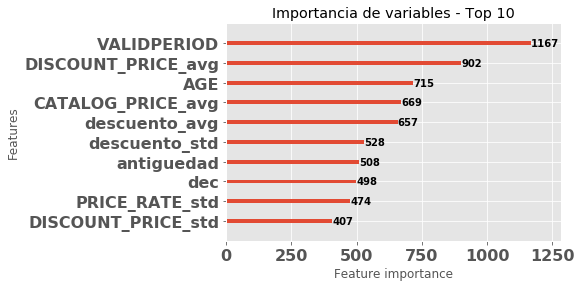

In [562]:
lgb.plot_importance(clf,max_num_features=10, title='Importancia de variables - Top 10')

In [108]:
shap.initjs()

In [109]:
explainer = shap.TreeExplainer(clf)
shap_values = explainer.shap_values(x_train_down)

In [110]:
shap.force_plot(explainer.expected_value, shap_values[12,:],x_train_down.iloc[19,:],feature_names=x_valid.columns)

In [111]:
shap.force_plot(explainer.expected_value, shap_values[:1000,:],x_train_down.iloc[:1000,:], feature_names=x_valid.columns)

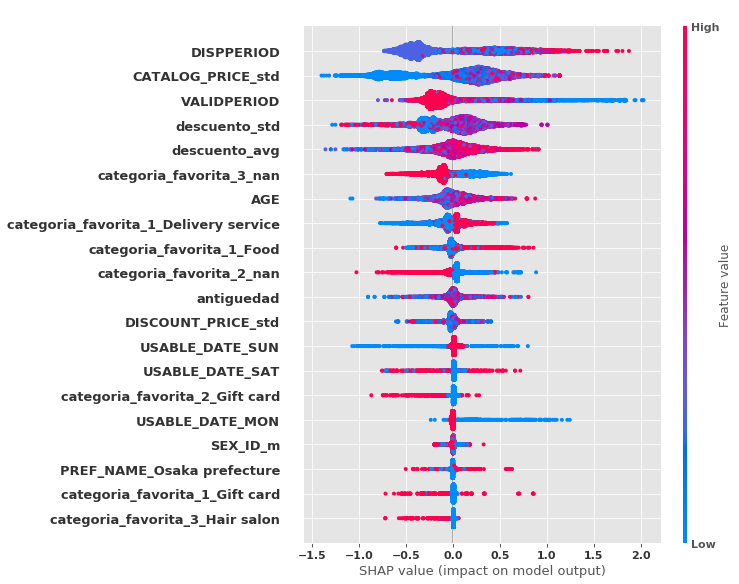

In [112]:
shap.summary_plot(shap_values, x_train_down)

In [113]:
avg_frame=x_valid.mean(axis=0).to_frame().T
avg_frame_20=pd.DataFrame(np.repeat(avg_frame.values,21,axis=0))
avg_frame_20.columns = avg_frame.columns

In [114]:
def partial_plot(feature):
    df_aux=avg_frame_20
    df_aux[feature]=x_valid[feature].quantile(
        q=[0.01, 0.05, 0.1, 0.15, 0.2, 0.25, 0.3, 0.35, 0.4, 0.45, 0.5, 0.55,
           0.6, 0.65, 0.7, 0.75, 0.8, 0.85, 0.9, 0.95, 0.99]
       ).values
    df_aux['mean_response']=clf.predict(df_aux)
    pplot = df_aux.plot(x=feature, y='mean_response', style='.-',legend=False,title=feature)

    return(pplot)

In [115]:
a = pd.DataFrame(sorted(zip(clf.feature_importance(),x_valid.columns)),columns = ['value','feature'])

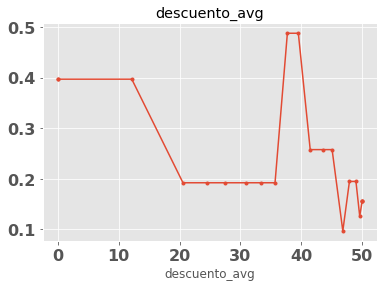

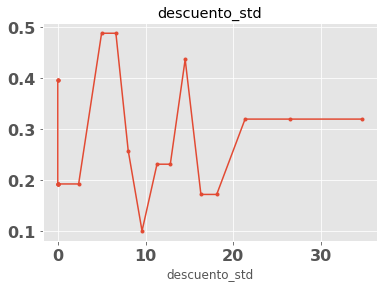

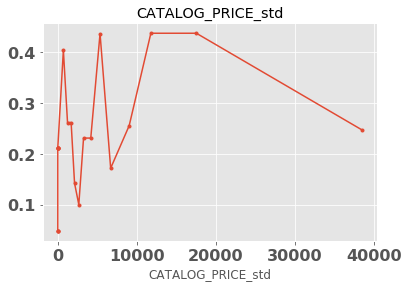

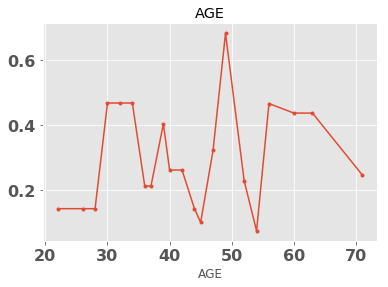

In [116]:
for i in a.tail(4).sort_values('value',ascending=False).feature.values:
    partial_plot(i)

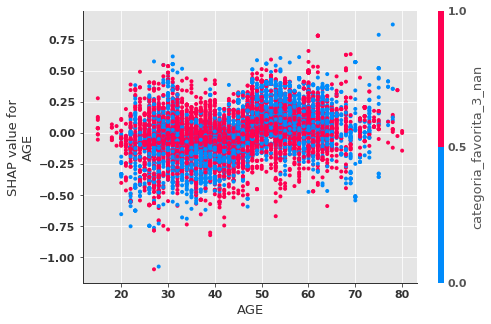

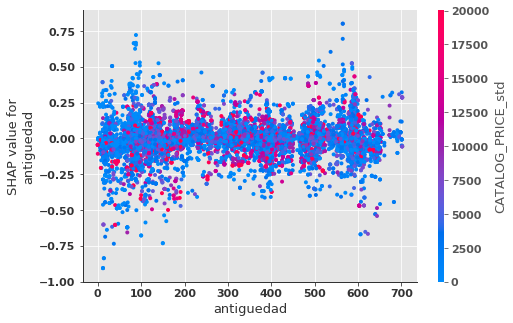

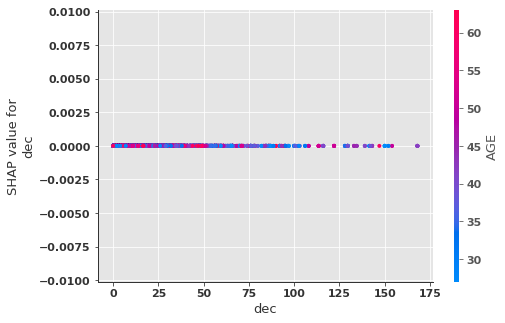

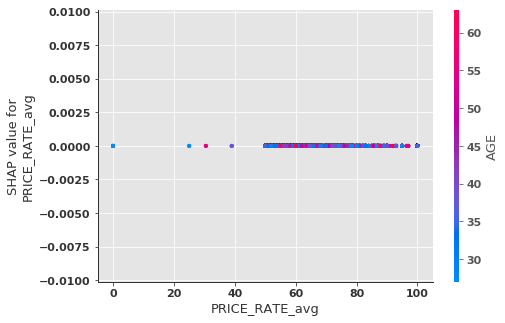

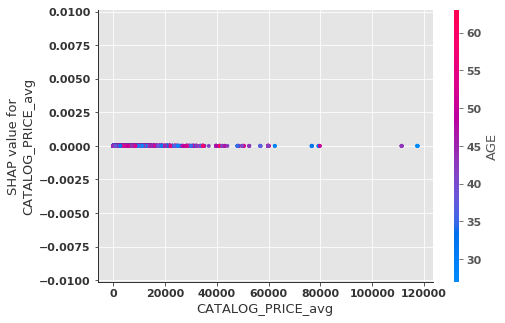

...

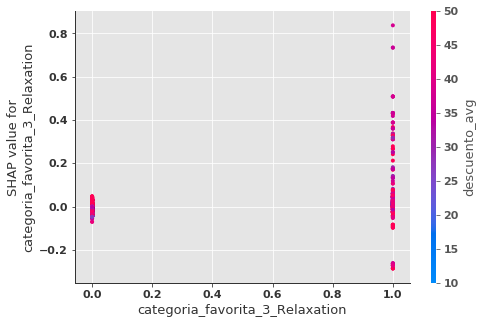

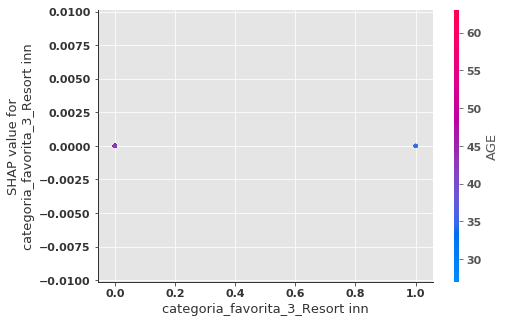

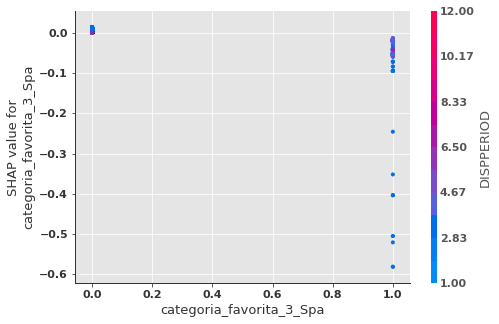

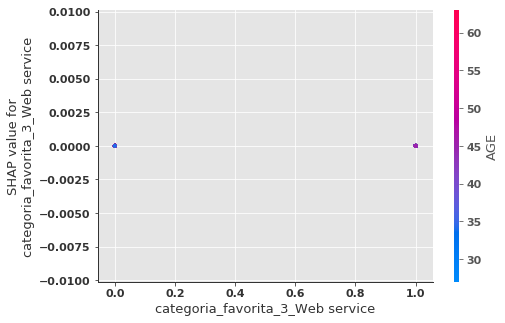

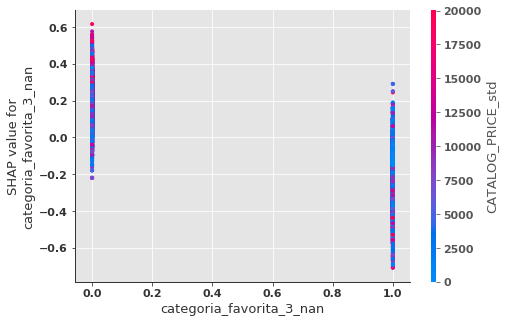

In [117]:
for name in x_train_down.columns:
    shap.dependence_plot(name, shap_values, x_train_down, feature_names=x_valid.columns)

# Conclusiones

Se obtuvo una primera aproximacion del modelo que prediga si un cupon es adecuado para un cierto usuario. Observando que hay usuarios que son sensibles al descuento obtenido y al precio del producto con el cupon.

Siguientes pasos:
 + Mejorar el modelo haciendo Feature Engineering (Tabla de visitas).
 + Optimización de metaparametros.
 + Cambiar de estrategia de Desbalance, en lugar de UnderSample, probar con Up/Down Weighted.
 + Agregar mayor historico de ventas para incrementar el numero de la clase objetivo
 + Comparar con otros modelos.

In [138]:
df_final = pd.DataFrame(df_pred.iloc[10:100].tuple)
df_final['proba'] = clf.predict(df_pred.iloc[10:100][x_cols])
df_final['clase'] = np.where(df_final.proba > 0.5,1,0)
df_final

,tuple,proba,clase
10,"(e06b97f026fa37f85f316a4195b5c517, 8ab8e732d3e...",0.93477,1
11,"(e06b97f026fa37f85f316a4195b5c517, 4b37c6ae8c0...",0.76811,1
12,"(e06b97f026fa37f85f316a4195b5c517, 3523757b21c...",0.90433,1
13,"(e06b97f026fa37f85f316a4195b5c517, 22660c7bde3...",0.81483,1
14,"(e06b97f026fa37f85f316a4195b5c517, 3be4e46c68f...",0.85015,1
15,"(e06b97f026fa37f85f316a4195b5c517, db57be0470a...",0.94079,1
16,"(e06b97f026fa37f85f316a4195b5c517, 1a4598e008f...",0.91601,1
17,"(e06b97f026fa37f85f316a4195b5c517, 15bb9dc58f8...",0.76811,1
18,"(e06b97f026fa37f85f316a4195b5c517, 23e2cbed8f1...",0.93477,1
19,"(e06b97f026fa37f85f316a4195b5c517, e8cc5386cde...",0.93477,1
